In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#### Load dataset

In [2]:
df = pd.read_csv('Bank_Customer.csv')
df = df.drop(['customer_id'], axis=1)
df.head()

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


#### Data Preparation
* 檢查資料有無缺失值

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   credit_score      10000 non-null  int64  
 1   country           10000 non-null  object 
 2   gender            10000 non-null  object 
 3   age               10000 non-null  int64  
 4   tenure            10000 non-null  int64  
 5   balance           10000 non-null  float64
 6   products_number   10000 non-null  int64  
 7   credit_card       10000 non-null  int64  
 8   active_member     10000 non-null  int64  
 9   estimated_salary  10000 non-null  float64
 10  churn             10000 non-null  int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 859.5+ KB


In [4]:
df.isna().sum()

credit_score        0
country             0
gender              0
age                 0
tenure              0
balance             0
products_number     0
credit_card         0
active_member       0
estimated_salary    0
churn               0
dtype: int64

* 查看資料集分布情形

In [5]:
df.describe()

,credit_score,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


* Target feature: Churn

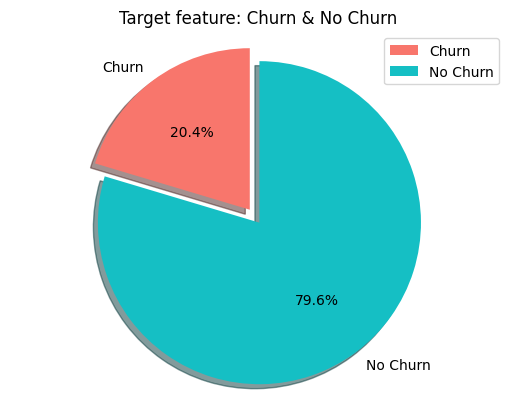

In [6]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Churn', 'No Churn'
sizes = [2037, 7963]
explode = (0.1, 0)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90, colors=('#F8766C', '#15BFC4'))
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.title("Target feature: Churn & No Churn")
plt.legend()
plt.show()

* 流失資料的分布情形

In [7]:
condition = df['churn'] == 1
df[condition].mean()

C:\Users\pcdm\AppData\Local\Temp\ipykernel_9020\3516504316.py:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[condition].mean()


credit_score           645.351497
age                     44.837997
tenure                   4.932744
balance              91108.539337
products_number          1.475209
credit_card              0.699067
active_member            0.360825
estimated_salary    101465.677531
churn                    1.000000
dtype: float64

In [8]:
condition = df['churn'] == 0
df[condition].mean()

C:\Users\pcdm\AppData\Local\Temp\ipykernel_9020\413645421.py:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[condition].mean()


credit_score          651.853196
age                    37.408389
tenure                  5.033279
balance             72745.296779
products_number         1.544267
credit_card             0.707146
active_member           0.554565
estimated_salary    99738.391772
churn                   0.000000
dtype: float64

#### Exploratory Data Analysis

* 資料視覺化

In [9]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 300
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set(style="whitegrid")

* 查看各國家男女的平均流失率

In [10]:
df[['country', 'churn']].groupby(['country']).agg(['mean','count'])

churn      
             mean count
country                
France   0.161548  5014
Germany  0.324432  2509
Spain    0.166734  2477

In [11]:
df[['country','gender','churn']].groupby(['country','gender']).agg(['mean','count'])

churn      
                    mean count
country gender                
France  Female  0.203450  2261
        Male    0.127134  2753
Germany Female  0.375524  1193
        Male    0.278116  1316
Spain   Female  0.212121  1089
        Male    0.131124  1388

In [12]:
df[['tenure', 'churn']].groupby(['tenure']).agg(['mean','count'])

churn      
            mean count
tenure                
0       0.230024   413
1       0.224155  1035
2       0.191794  1048
3       0.211100  1009
4       0.205258   989
5       0.206522  1012
6       0.202689   967
7       0.172179  1028
8       0.192195  1025
9       0.216463   984
10      0.206122   490

* Histogram

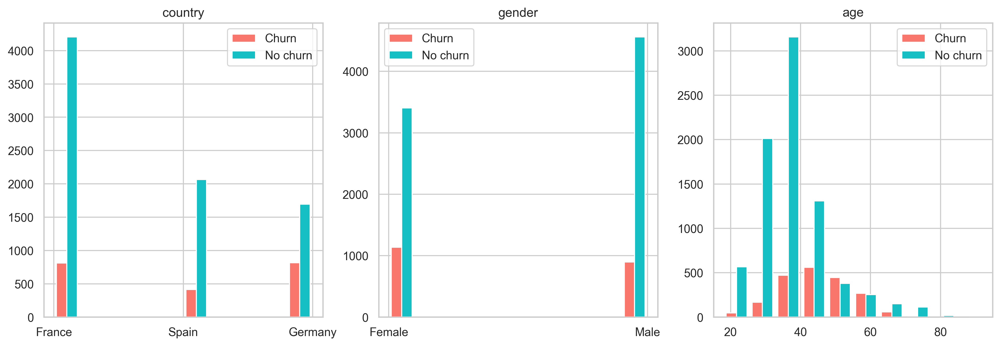

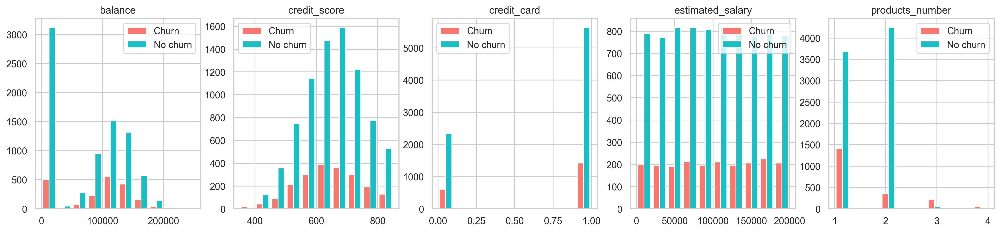

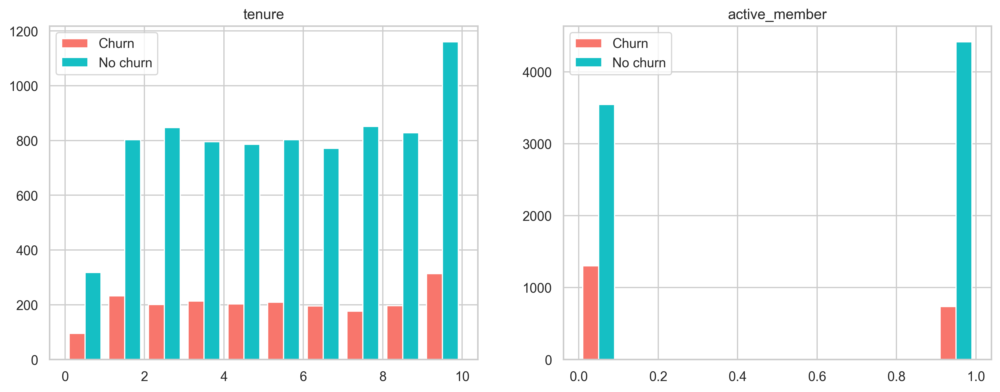

In [13]:
group_data = (
        ('country', 'gender', 'age'),  # 1 3
        ('balance', 'credit_score', 'credit_card', 'estimated_salary', 'products_number'),     # 1 5
        ('tenure', 'active_member')    # 1 2
)

fig_size = (
        (16, 5, 1, len(group_data[0])),
        (20, 4, 1, len(group_data[1])),
        (14, 5, 1, len(group_data[2]))
)

# Creating plot
for i in range(len(group_data)): # i: [0, 3]
        idx = 1
        fig = plt.figure(figsize=(fig_size[i][0], fig_size[i][1]))
        for label in group_data[i]:
                y = df[label][df['churn'] == 1]
                n = df[label][df['churn'] == 0]
                g = fig.add_subplot(fig_size[i][2], fig_size[i][3], idx)
                plt.title(label)
                plt.hist([y, n], label=('Churn', 'No churn'), color=('#F8766C', '#15BFC4'))
                idx += 1
                # show plot
                plt.legend()
        plt.show()

* Correlation Matrix

C:\Users\pcdm\AppData\Local\Temp\ipykernel_9020\2145137363.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(corr_mat.corr(), annot=True, cmap="Blues")


<AxesSubplot: >

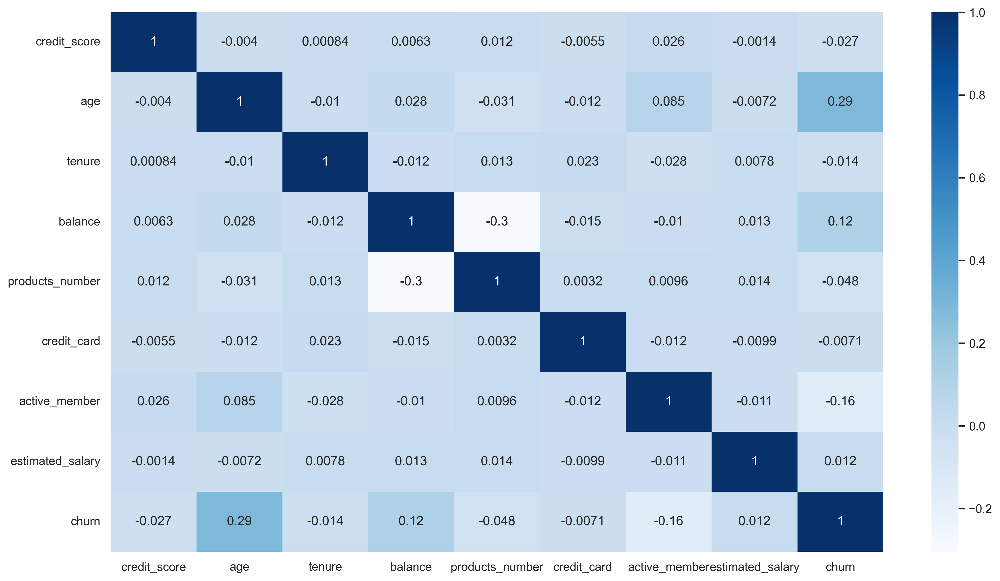

In [14]:
plt.figure(figsize=(16, 9))
# mask=np.triu(bank_customer.corr())
corr_mat = df.drop(['churn'], axis=1)
corr_mat['churn'] = df[['churn']]
sns.heatmap(corr_mat.corr(), annot=True, cmap="Blues")

C:\Users\pcdm\AppData\Local\Temp\ipykernel_9020\3995578463.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[target], hist = True, kde = True, kde_kws = {'shade': True, 'linewidth': 2})
c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)
C:\Users\pcdm\AppData\Local\Temp\ipykernel_9020\3995578463.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in s

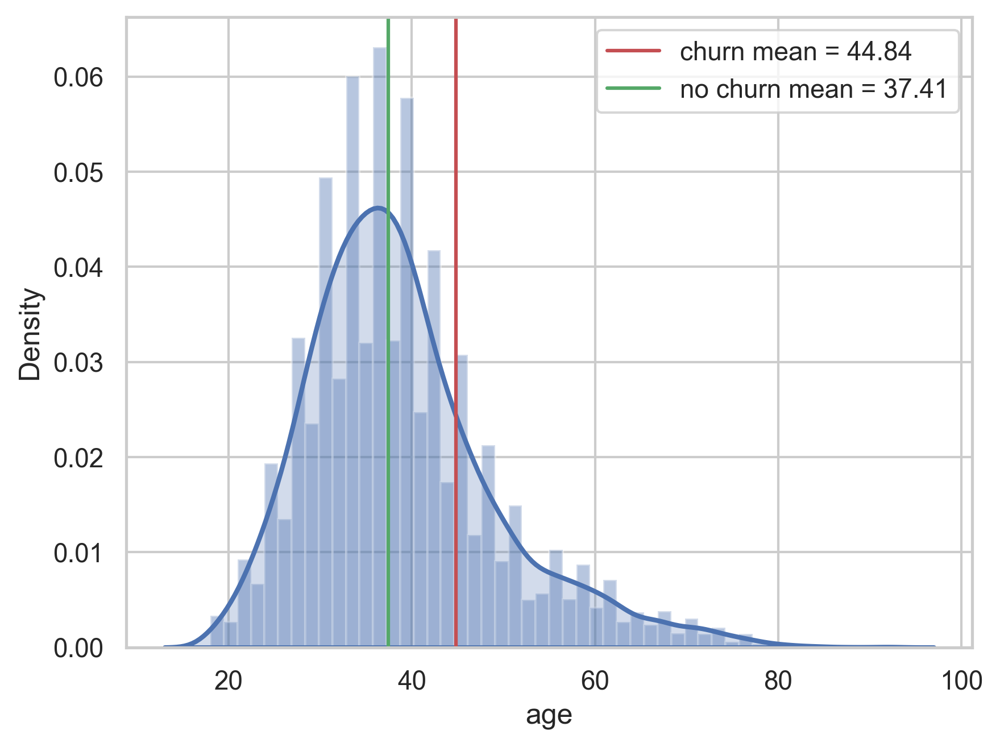

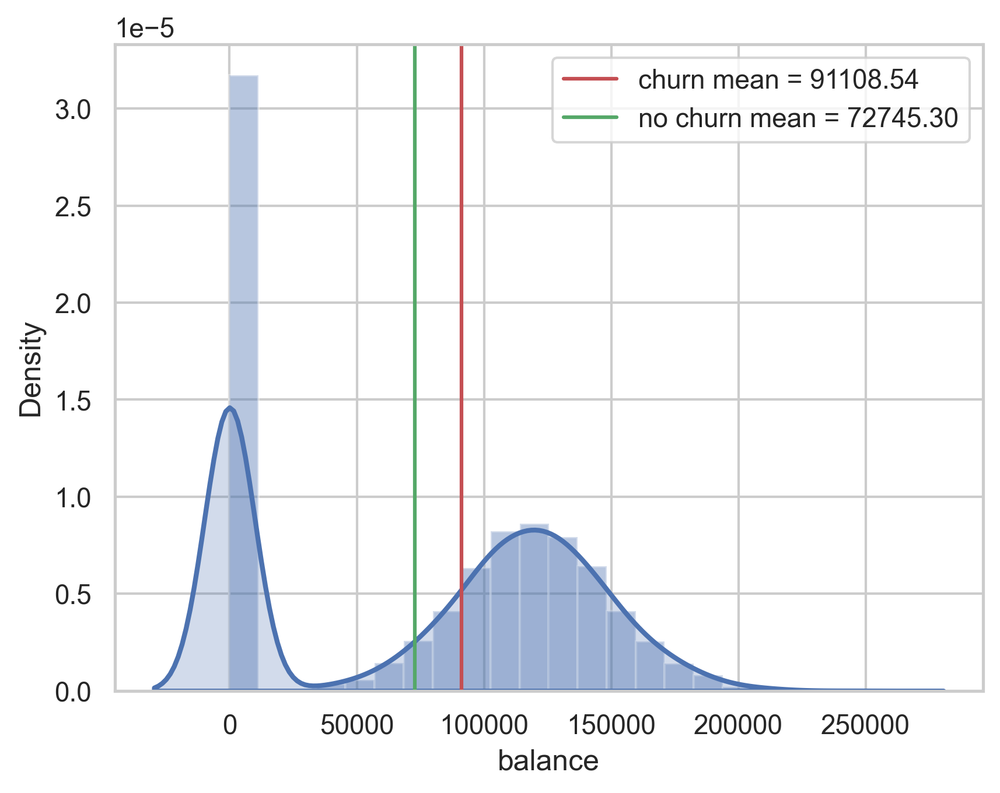

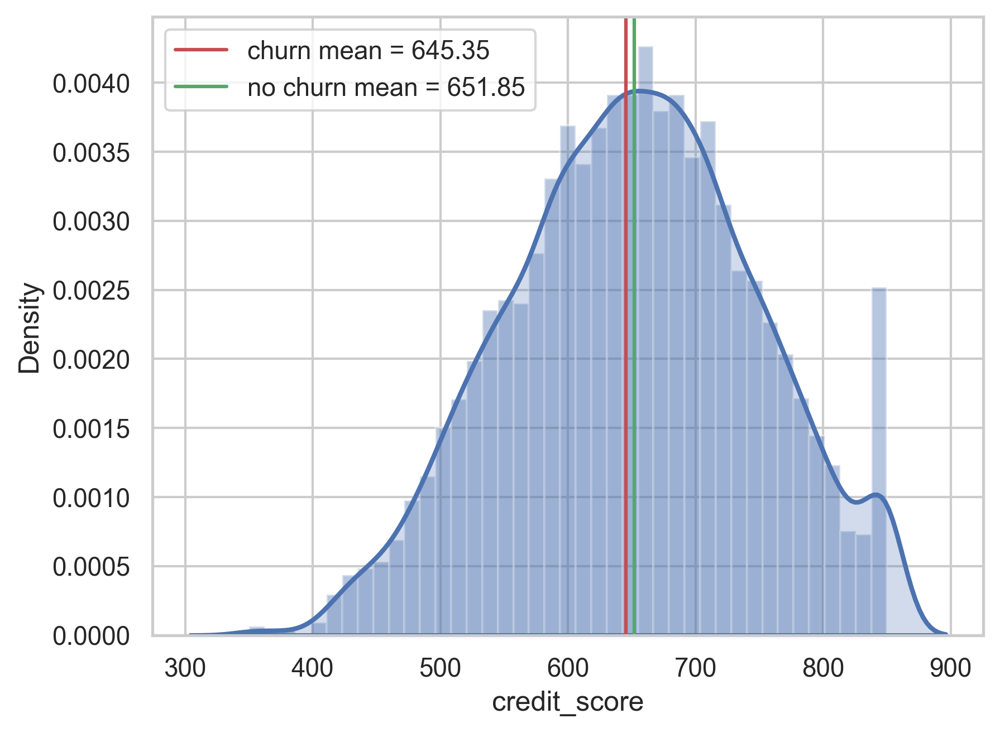

In [15]:
p_churn, p_no_churn = df['churn'] == 1, df['churn'] == 0

targets = ('age', 'balance', 'credit_score')

for target in targets:
    fig = plt.figure()
    sns.distplot(df[target], hist = True, kde = True, kde_kws = {'shade': True, 'linewidth': 2})
    churn_mean, no_churn_mean = df[target][p_churn].mean(), df[target][p_no_churn].mean()
    plt.axvline(x=churn_mean, color='r', label=f"churn mean = {churn_mean:.2f}")
    plt.axvline(x=no_churn_mean, color='g', label=f"no churn mean = {no_churn_mean:.2f}")
    plt.legend()

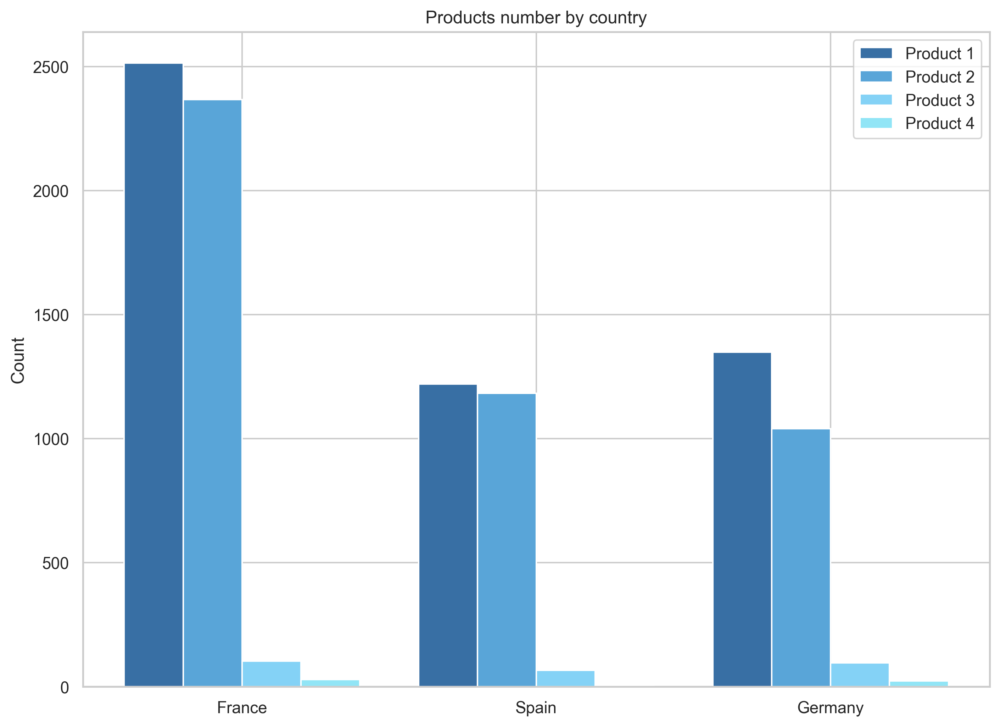

In [16]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'country', 'products_number'
plt.title('Products number by country')
plt.hist([df[x_label][df[y_label] == i] for i in range(1, 5)], bins=np.arange(-0.5, 3, 1), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
# show plot
plt.legend()
plt.show()

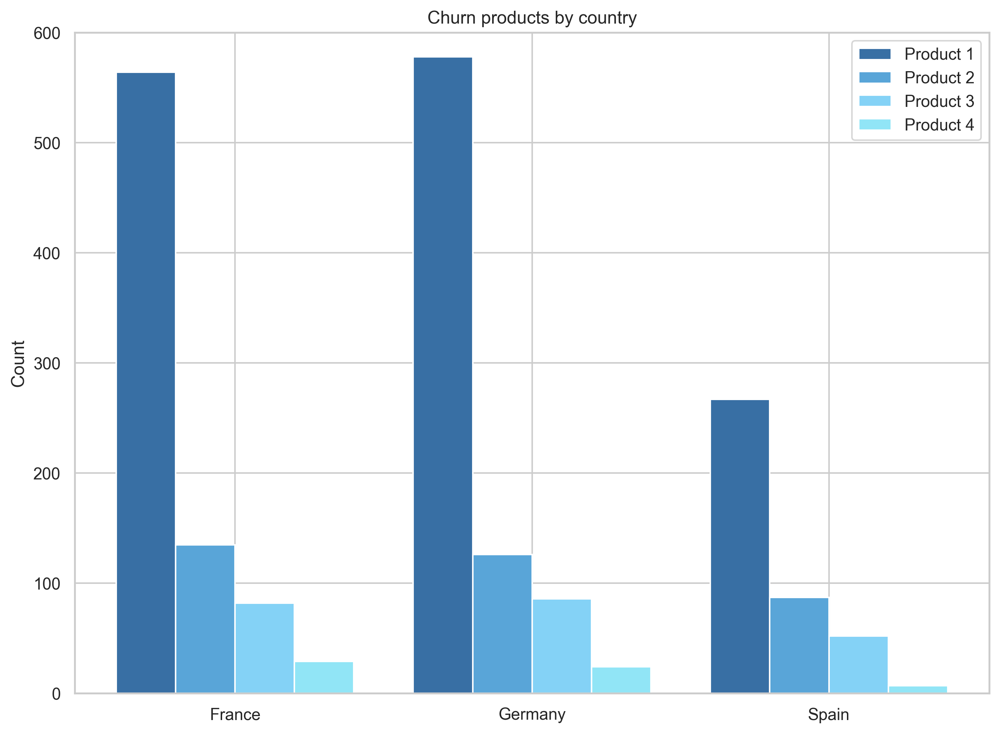

In [17]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'country', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title('Churn products by country')
plt.hist(P, bins=np.arange(-0.5, 3, 1), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.ylim(0, 600)
# show plot
plt.legend()
plt.show()

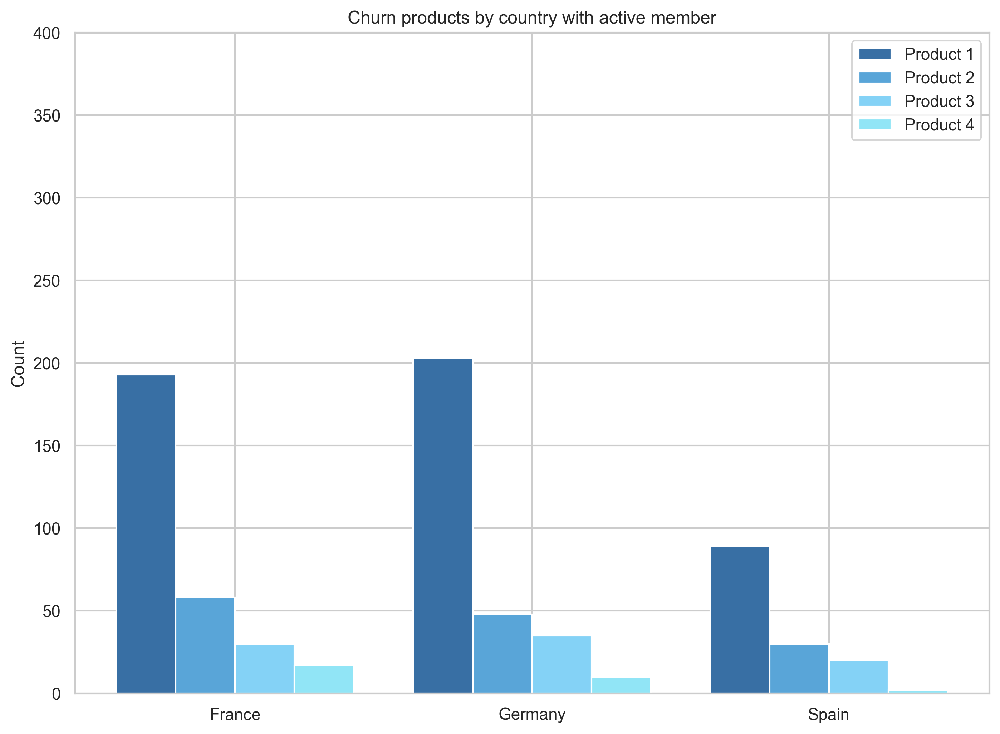

In [18]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'country', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['active_member'] == 1) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title('Churn products by country with active member')
plt.hist(P, bins=np.arange(-0.5, 3, 1), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.ylim(0, 400)
# show plot
plt.legend()
plt.show()

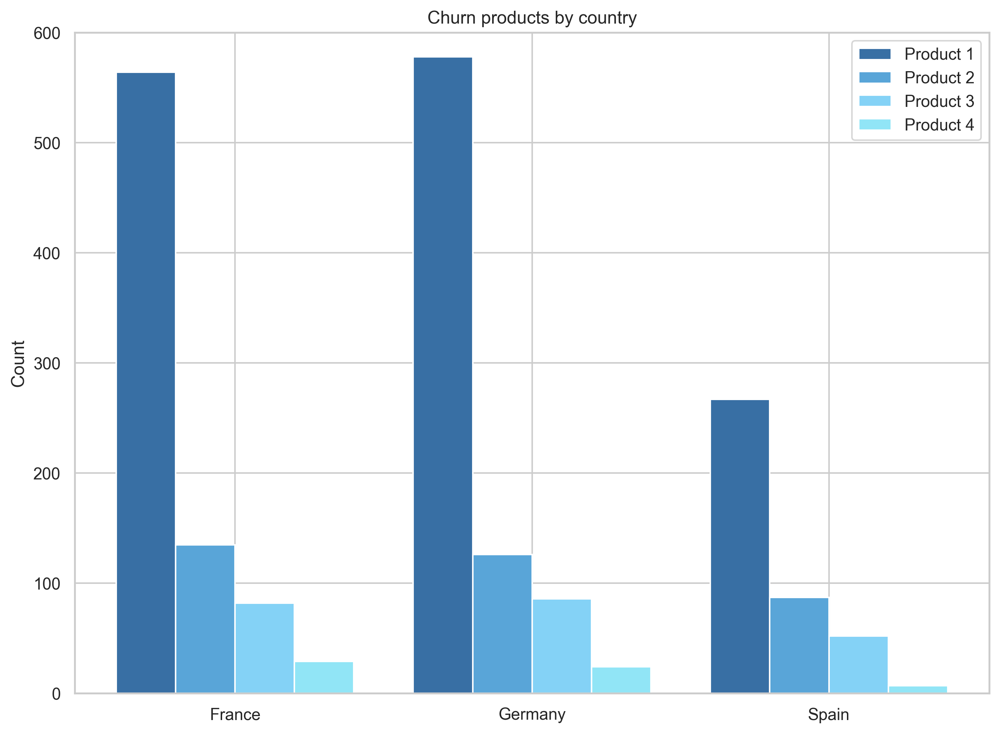

In [19]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'country', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title('Churn products by country')
plt.hist(P, bins=np.arange(-0.5, 3, 1), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.ylim(0, 600)
# show plot
plt.legend()
plt.show()

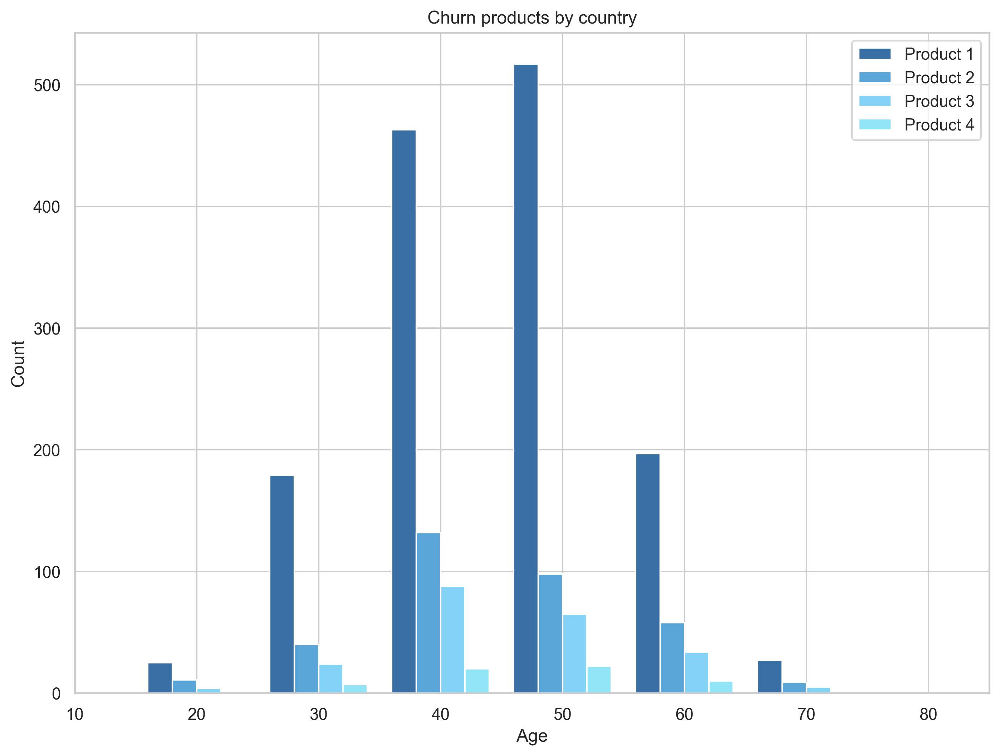

In [20]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'age', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title('Churn products by country')
plt.hist(P, bins=np.arange(15, 105, 10), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.xlabel('Age')
plt.xticks(range(10, 90, 10))
plt.xlim(10, 85)
# show plot
plt.legend()
plt.show()

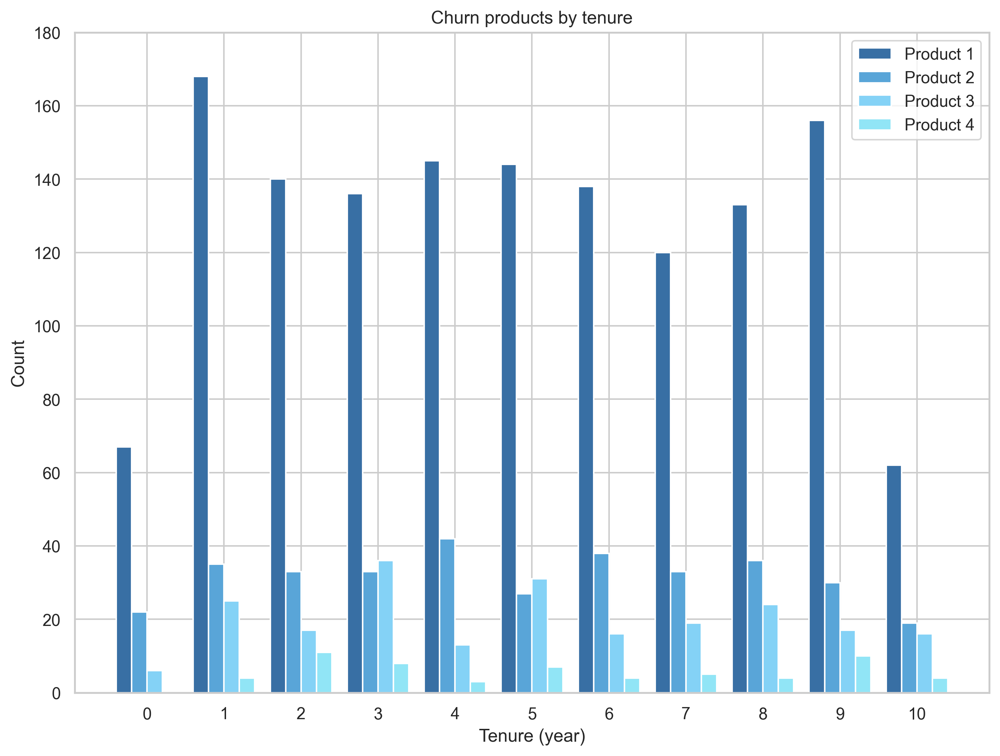

In [21]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'tenure', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title(f'Churn products by {x_label}')
plt.hist(P, bins=np.arange(-0.5, 11, 1), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.ylim(0, 180)
plt.xlabel('Tenure (year)')
plt.xticks(range(0, 11, 1))

# show plot
plt.legend()
plt.show()

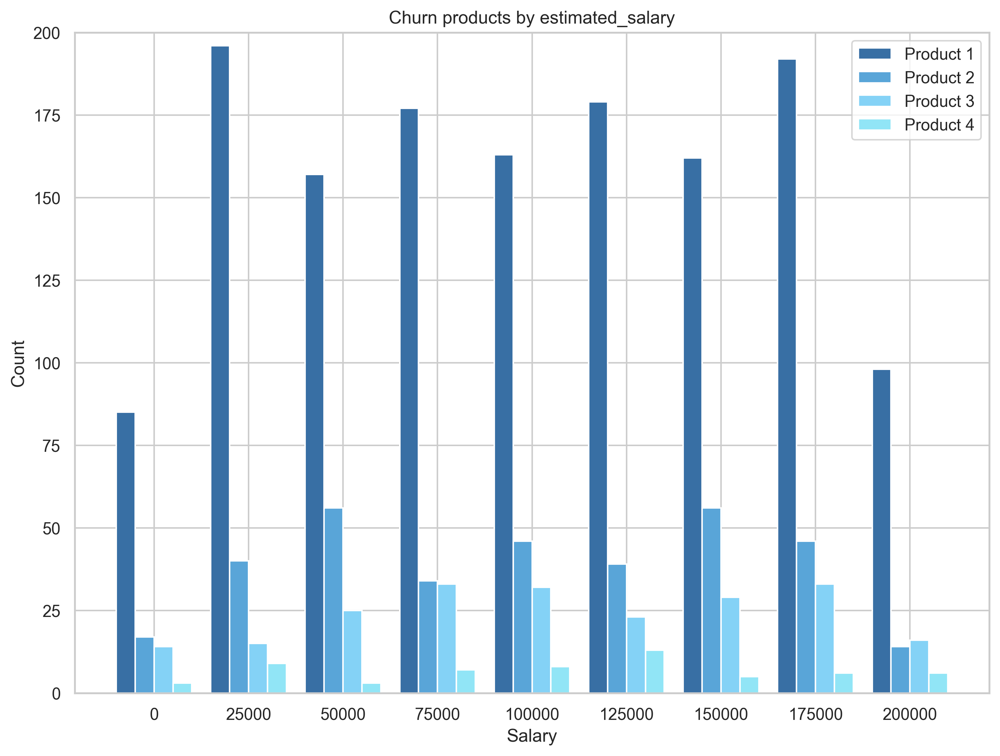

In [22]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'estimated_salary', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title(f'Churn products by {x_label}')
plt.hist(P, bins=np.arange(-12500, 225000, 25000), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.ylim(0, 200)
plt.xlabel('Salary')
plt.xticks(range(0, 225000, 25000))

# show plot
plt.legend()
plt.show()

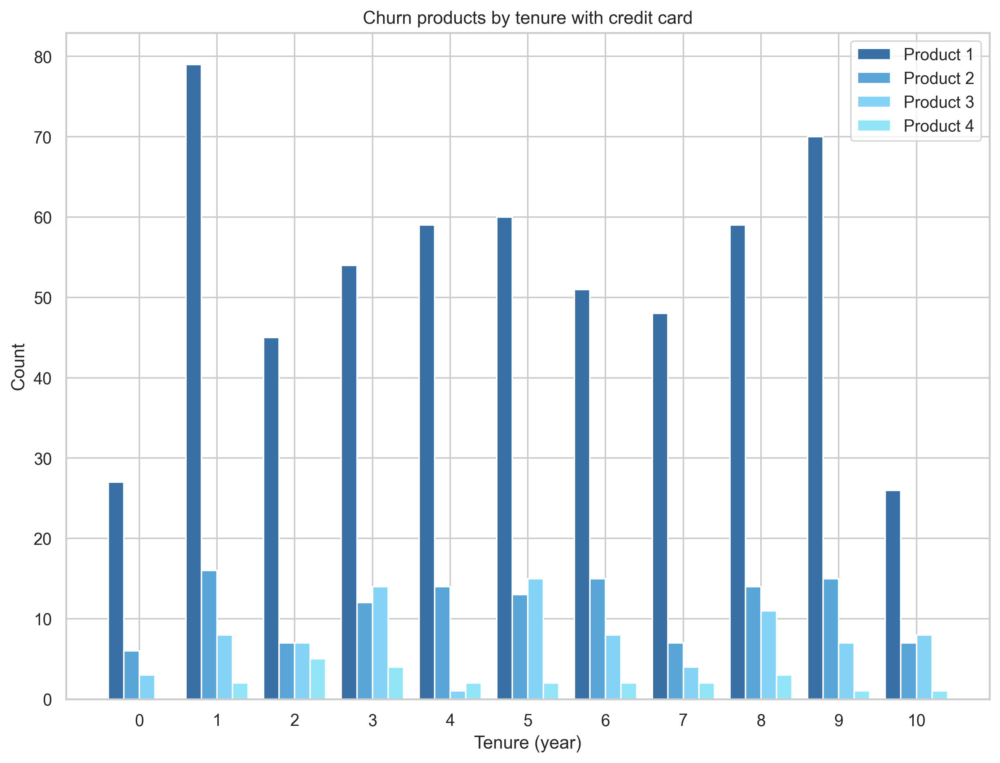

In [23]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'tenure', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['country'] == 'Germany') & (df['churn'] == 1)] for i in range(1, 5)]
plt.title('Churn products by tenure with credit card')
plt.hist(P, bins=np.arange(-0.5, 11, 1), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')

plt.xlabel('Tenure (year)')
plt.xticks(range(0, 11, 1))
# show plot
plt.legend()
plt.show()

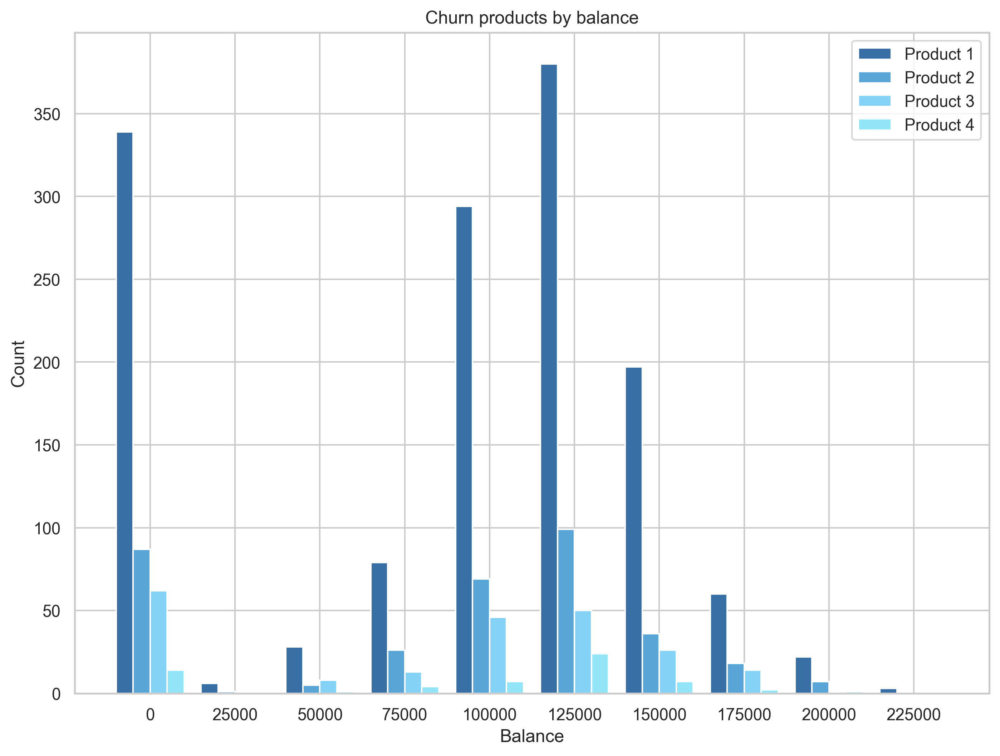

In [24]:
fig = plt.figure(figsize=(11, 8))

x_label, y_label = 'balance', 'products_number'
P = [df[x_label][(df[y_label] == i) & (df['churn'] == 1)] for i in range(1, 5)]
plt.title(f'Churn products by {x_label}')
plt.hist(P, bins=np.arange(-12500, 250000, 25000), label=[f'Product {i}' for i in range(1, 5)], color=('#386fa4', '#59a5d8', '#84d2f6', '#91e5f6'))
plt.ylabel('Count')
plt.xlabel('Balance')
plt.xticks(range(0, 250000, 25000))
# show plot
plt.legend()
plt.show()

* Boxplot

Text(0.5, 1.0, 'products_number & age vs churn')

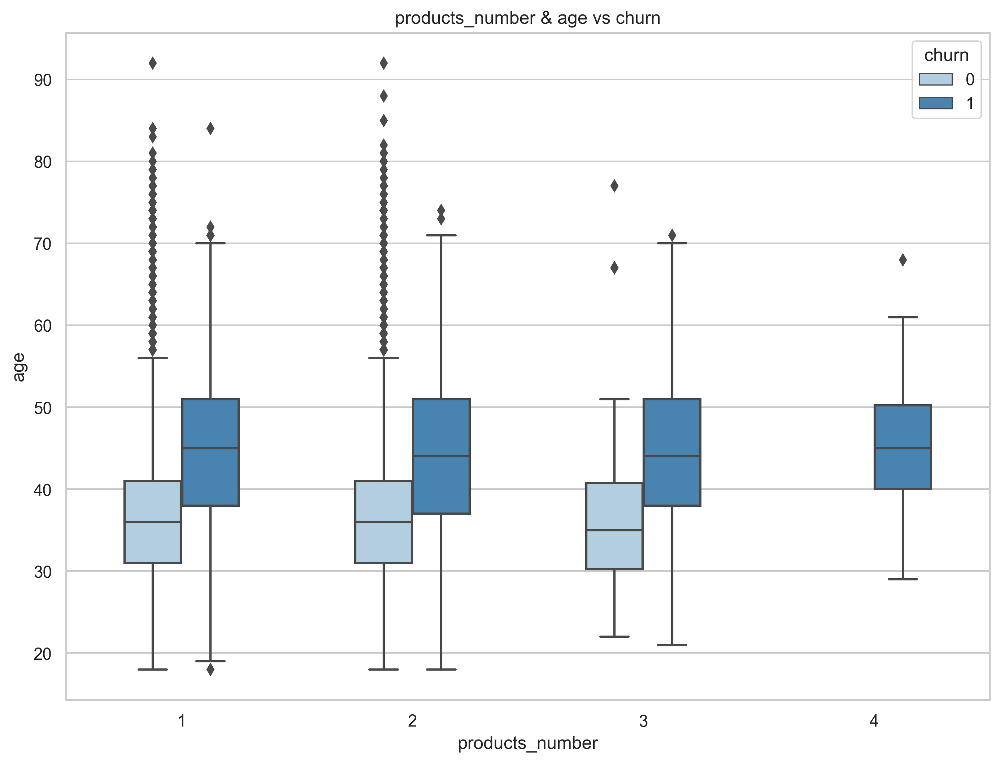

In [25]:
fig, ax = plt.subplots(figsize=(11, 8))
x_label, y_label = 'products_number', 'age'
sns.boxplot(x=x_label, y=y_label, data=df, hue='churn', palette="Blues", width=0.5)
ax.set_title(f'{x_label} & {y_label} vs churn')

Text(0.5, 1.0, 'products_number & balance vs churn')

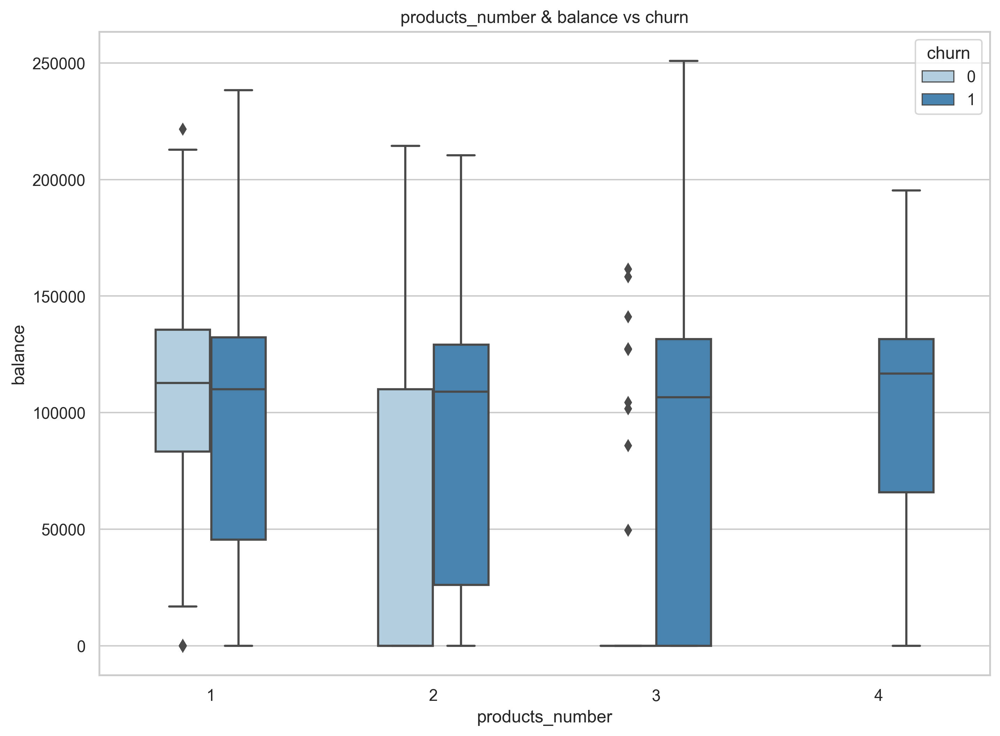

In [26]:
fig, ax = plt.subplots(figsize=(11, 8))
x, y = 'products_number', 'balance'
sns.boxplot(x=x, y=y, data=df, hue='churn', palette="Blues", width=0.5)
ax.set_title(f'{x} & {y} vs churn')

Text(0.5, 1.0, 'country & age vs churn')

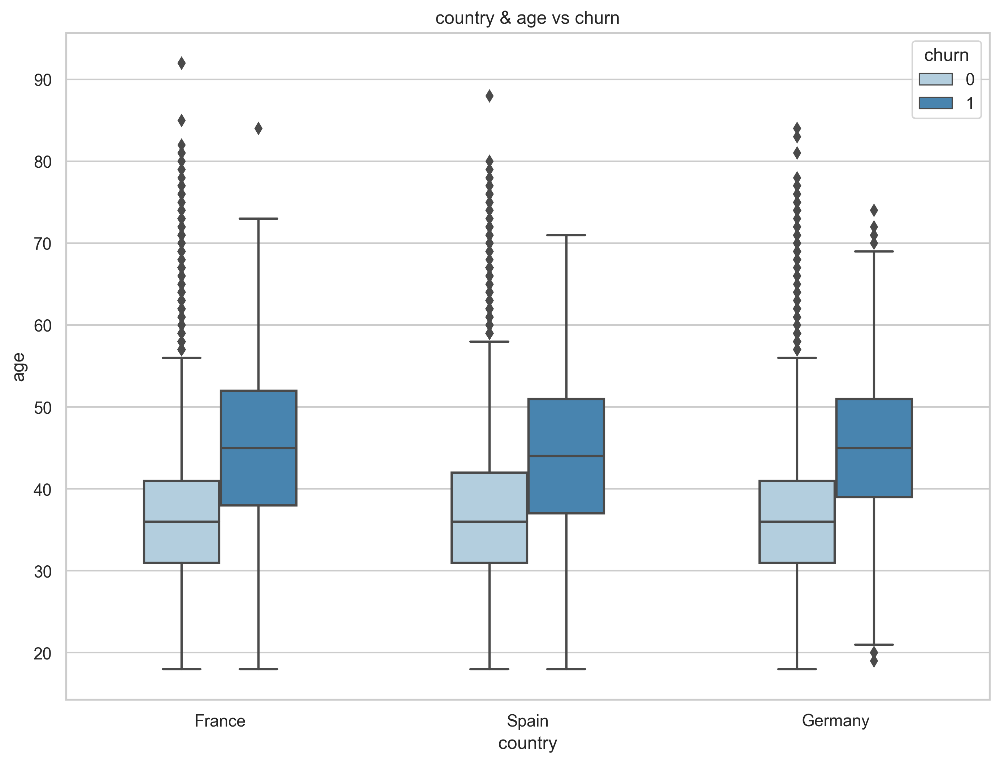

In [27]:
fig, ax = plt.subplots(figsize=(11, 8))
x, y = 'country', 'age'
sns.boxplot(x=x, y=y, data=df, hue='churn', palette="Blues", width=0.5)
ax.set_title(f'{x} & {y} vs churn')

Text(0.5, 1.0, 'country & balance vs churn')

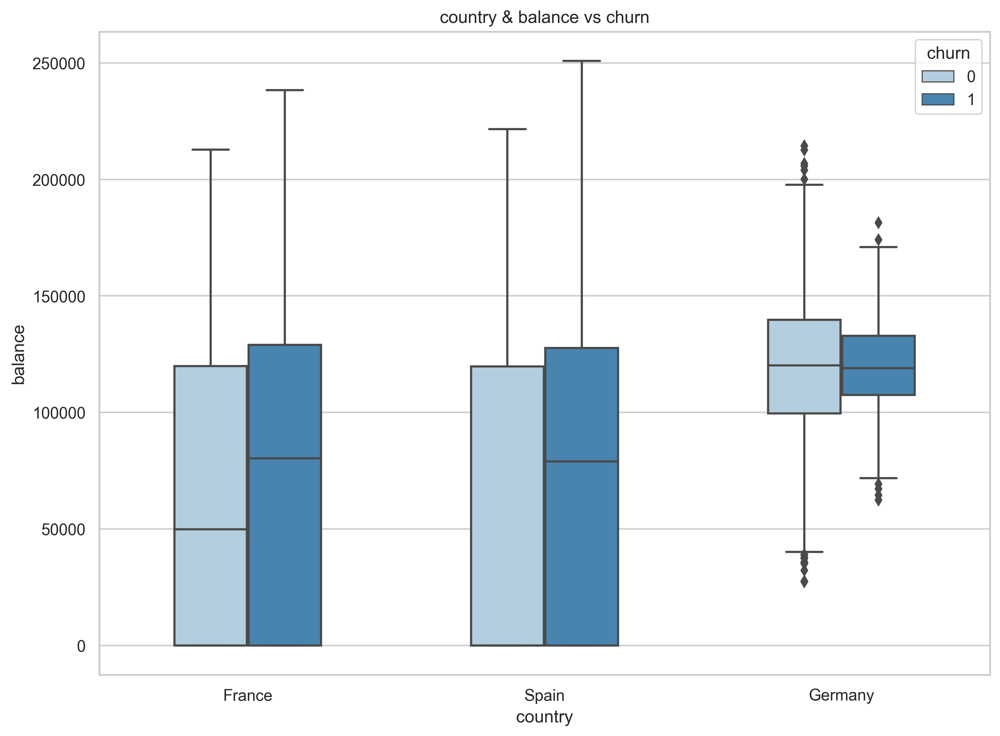

In [28]:
fig, ax = plt.subplots(figsize=(11, 8))
x, y = 'country', 'balance'
sns.boxplot(x=x, y=y, data=df, hue='churn', palette="Blues", width=0.5)
ax.set_title(f'{x} & {y} vs churn')

Text(0.5, 1.0, 'country & tenure vs churn')

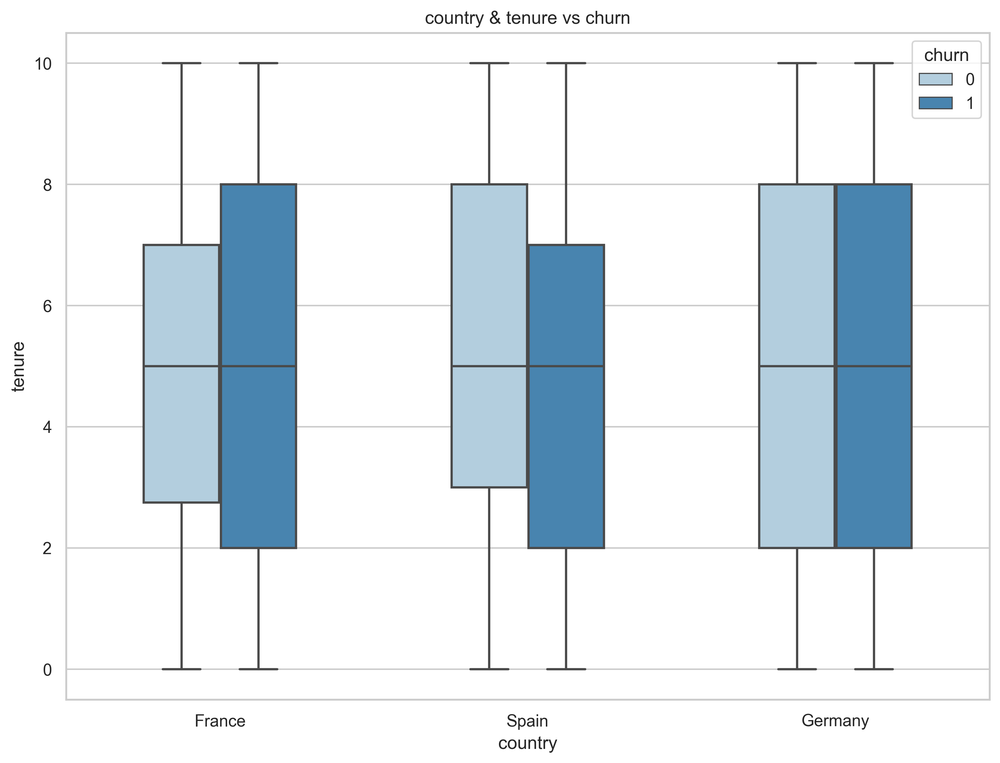

In [29]:
fig, ax = plt.subplots(figsize=(11, 8))
x, y = 'country', 'tenure'
sns.boxplot(x=x, y=y, data=df, hue='churn', palette="Blues", width=0.5)
ax.set_title(f'{x} & {y} vs churn')

Text(0.5, 1.0, 'country & estimated_salary vs churn')

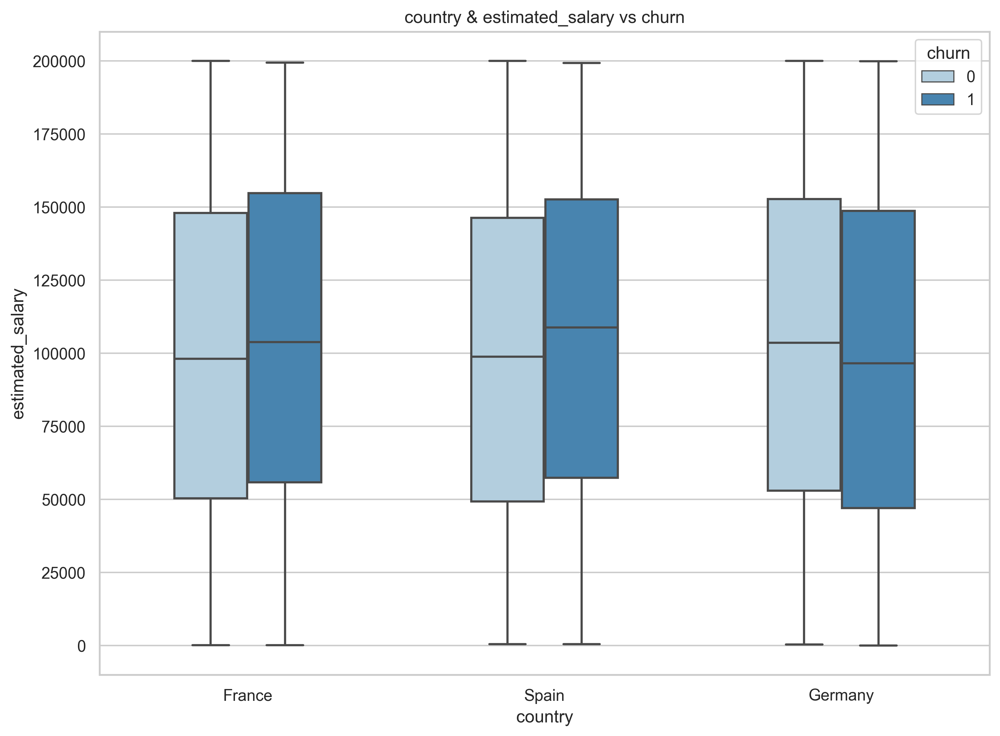

In [30]:
fig, ax = plt.subplots(figsize=(11, 8))
x, y = 'country', 'estimated_salary'
sns.boxplot(x=x, y=y, data=df, hue='churn', palette="Blues", width=0.5)
ax.set_title(f'{x} & {y} vs churn')

In [31]:
df['salary_score'] = df['estimated_salary']/df['credit_score']
df['card_active'] = (df['credit_card'] == 0) & (df['active_member'] == 1)
df.head()

,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn,salary_score,card_active
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,163.730016,False
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,185.102928,True
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,226.955319,False
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,134.229800,False
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,93.040118,False


In [32]:
sns.pairplot(data=df, hue='churn', palette="Blues")

### Feature Engineering

* Data Preprocessing

In [33]:
from sklearn.preprocessing import LabelEncoder
# Label encoding
labelencoder = LabelEncoder()
df["gender"] = labelencoder.fit_transform(df["gender"])
# One hot encoding
df = pd.get_dummies(df, columns=['country'])
df = pd.get_dummies(df, columns=['products_number'])
df.head()

,credit_score,gender,age,tenure,balance,credit_card,active_member,estimated_salary,churn,salary_score,card_active,country_France,country_Germany,country_Spain,products_number_1,products_number_2,products_number_3,products_number_4
0,619,0,42,2,0.00,1,1,101348.88,1,163.730016,False,1,0,0,1,0,0,0
1,608,0,41,1,83807.86,0,1,112542.58,0,185.102928,True,0,0,1,1,0,0,0
2,502,0,42,8,159660.80,1,0,113931.57,1,226.955319,False,1,0,0,0,0,1,0
3,699,0,39,1,0.00,0,0,93826.63,0,134.229800,False,1,0,0,0,1,0,0
4,850,0,43,2,125510.82,1,1,79084.10,0,93.040118,False,0,0,1,1,0,0,0


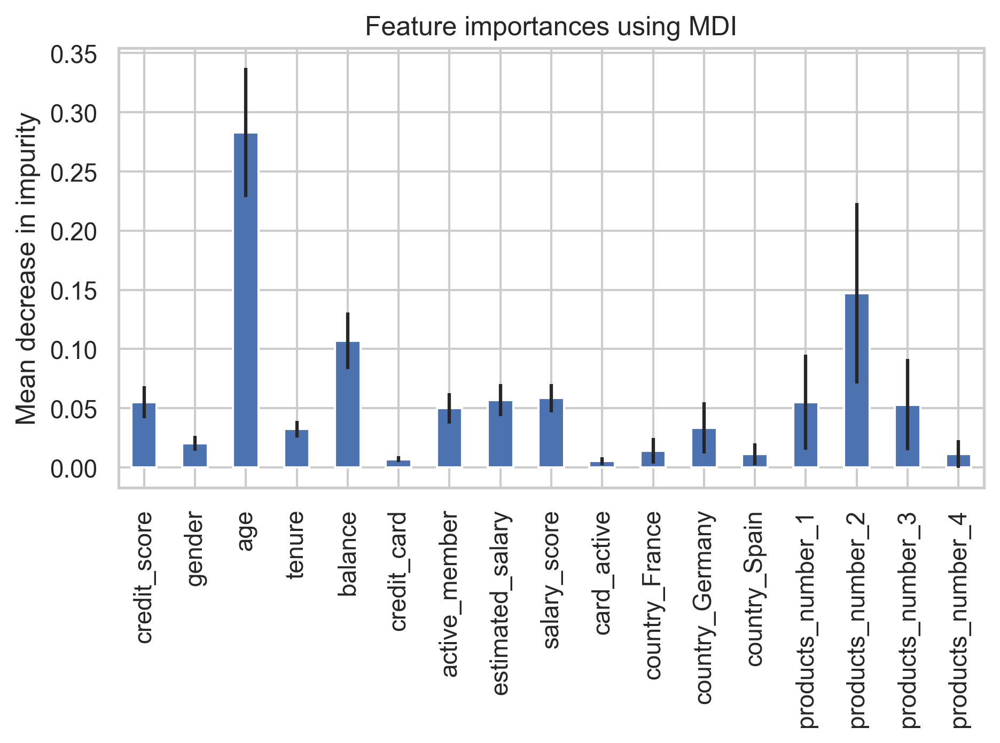

In [34]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split


X, y = df.drop(['churn'], axis=1), df['churn']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(max_depth=10, class_weight='balanced')
clf.fit(X, y)
feature_names = list(X.columns)
importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)


forest_importances = pd.Series(importances, index=feature_names)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

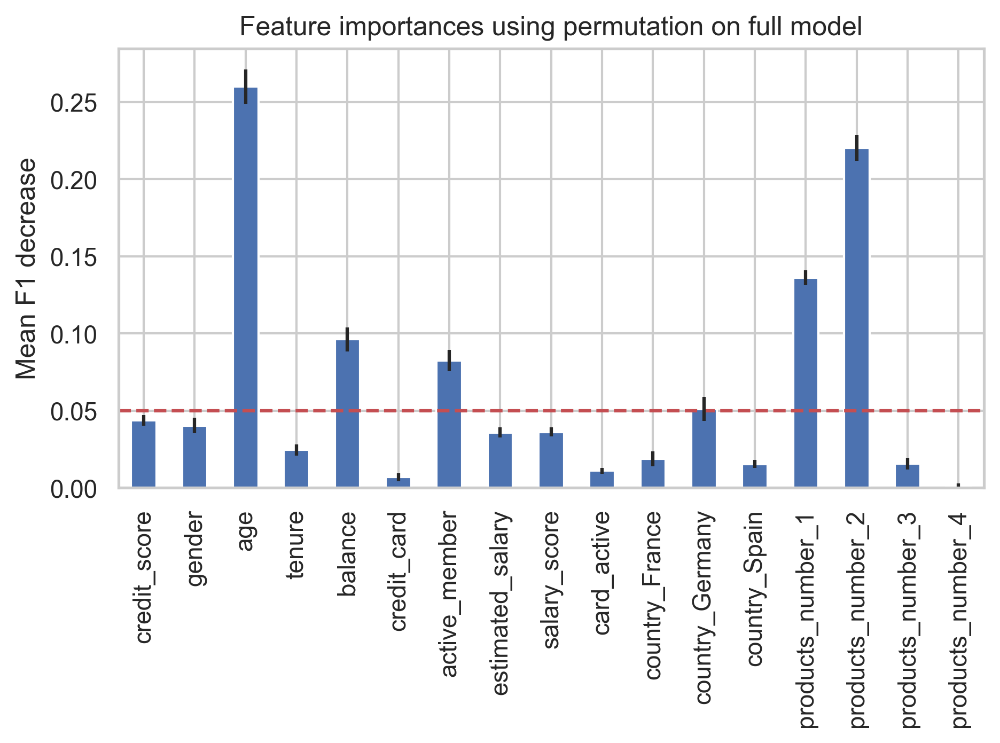

In [35]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    clf, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1, scoring='f1'
)

forest_importances = pd.Series(result.importances_mean, index=feature_names)
fig, ax = plt.subplots()
plt.axhline(y=0.05, color='r', linestyle='--')
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean F1 decrease")
fig.tight_layout()
plt.show()

* Split train and test set

In [36]:
from sklearn.model_selection import train_test_split
# Split the data into training and test sets
X = df[[
    'age',
    'balance',
    'products_number_1',
    'products_number_2',
    'active_member'
]]
y = df['churn']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

* Building Pipeline

In [37]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', None)
])
pipe.steps

[('scaler', StandardScaler()), ('clf', None)]

* Building Model

In [38]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.neighbors import KNeighborsClassifier


clfs = []
clfs.append(('Decision Tree', DecisionTreeClassifier(class_weight= 'balanced', max_depth=3)))
clfs.append(('Random Forest', RandomForestClassifier(class_weight='balanced', max_depth=3)))
clfs.append(('Gradient Boosting', GradientBoostingClassifier()))
clfs.append(('Logistic Regression', LogisticRegression(class_weight='balanced')))
clfs.append(('SVC', SVC(class_weight='balanced')))
clfs.append(('Gaussian Naive Bayes', GaussianNB()))
clfs.append(('KNN', KNeighborsClassifier()))

Decision Tree


Classification Report

              precision    recall  f1-score   support

           0       0.91      0.83      0.87      1607
           1       0.49      0.68      0.57       393

    accuracy                           0.80      2000
   macro avg       0.70      0.75      0.72      2000
weighted avg       0.83      0.80      0.81      2000



10-fold Cross Vaildation

accuracy: 77.8%
precision_macro: 68.9%
recall_macro: 73.7%
f1_macro: 70.3%


Decision Tree Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


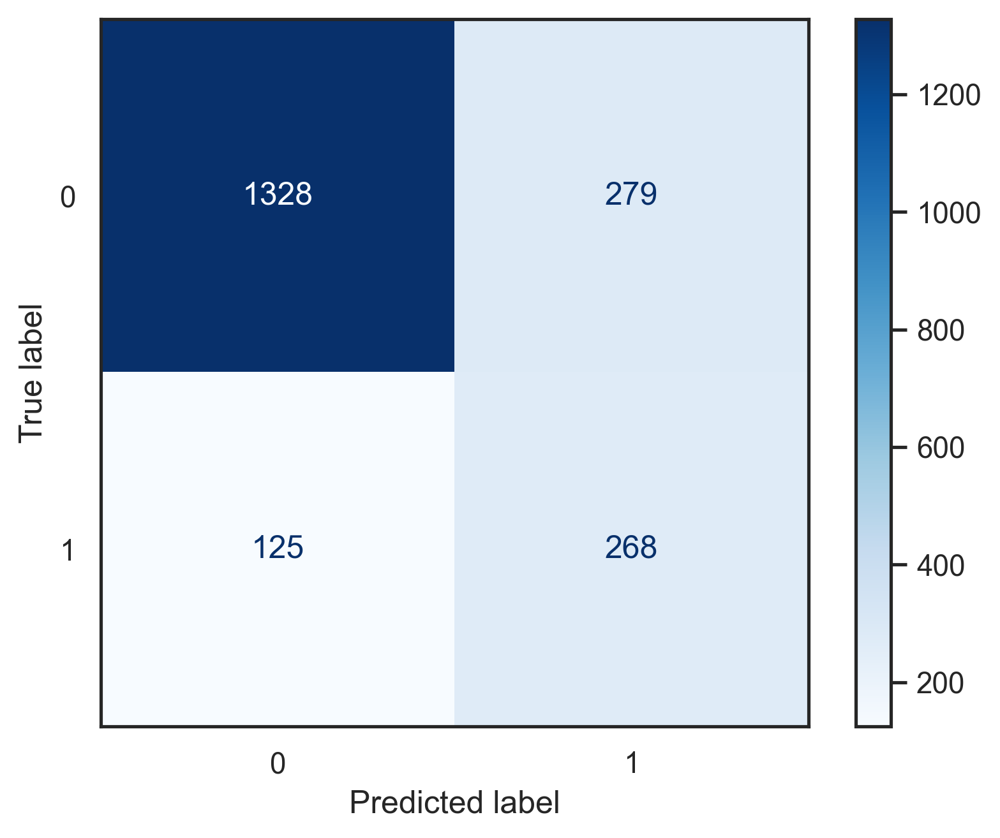

-----------------------------------
Random Forest


Classification Report

              precision    recall  f1-score   support

           0       0.92      0.78      0.84      1607
           1       0.44      0.72      0.54       393

    accuracy                           0.76      2000
   macro avg       0.68      0.75      0.69      2000
weighted avg       0.82      0.76      0.78      2000



10-fold Cross Vaildation

accuracy: 78.0%
precision_macro: 69.8%
recall_macro: 75.4%
f1_macro: 71.6%


Random Forest Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


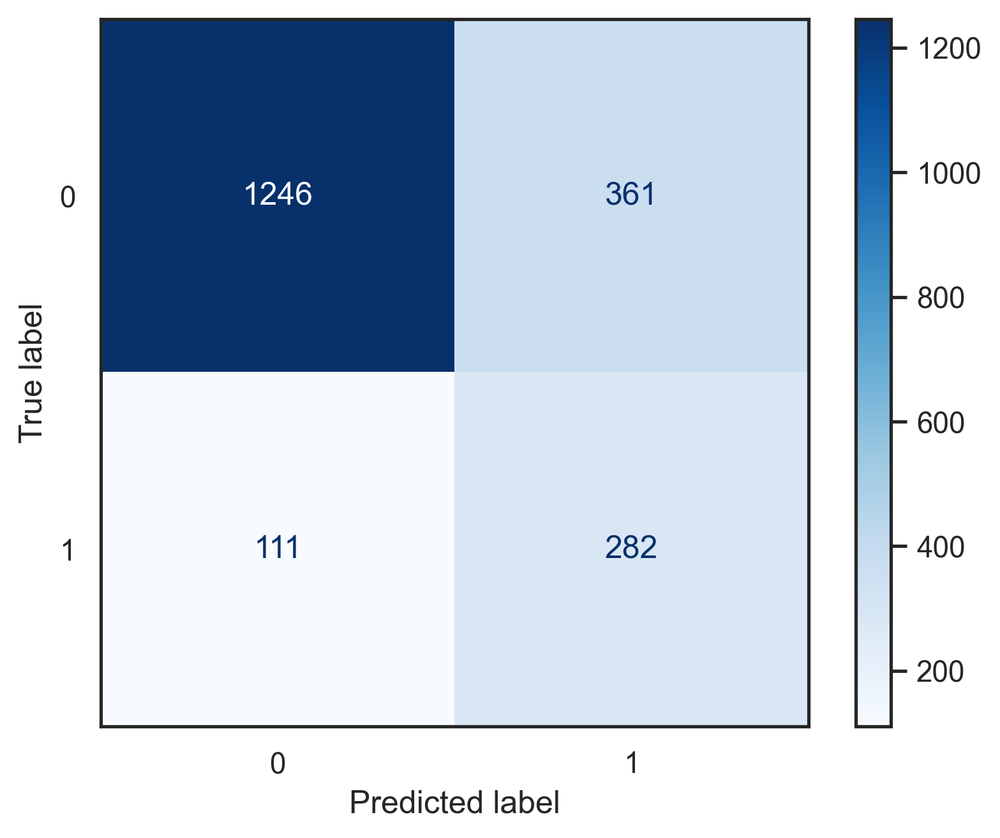

-----------------------------------
Gradient Boosting


Classification Report

              precision    recall  f1-score   support

           0       0.87      0.96      0.92      1607
           1       0.75      0.43      0.55       393

    accuracy                           0.86      2000
   macro avg       0.81      0.70      0.73      2000
weighted avg       0.85      0.86      0.84      2000



10-fold Cross Vaildation

accuracy: 85.8%
precision_macro: 82.3%
recall_macro: 70.2%
f1_macro: 73.6%


Gradient Boosting Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


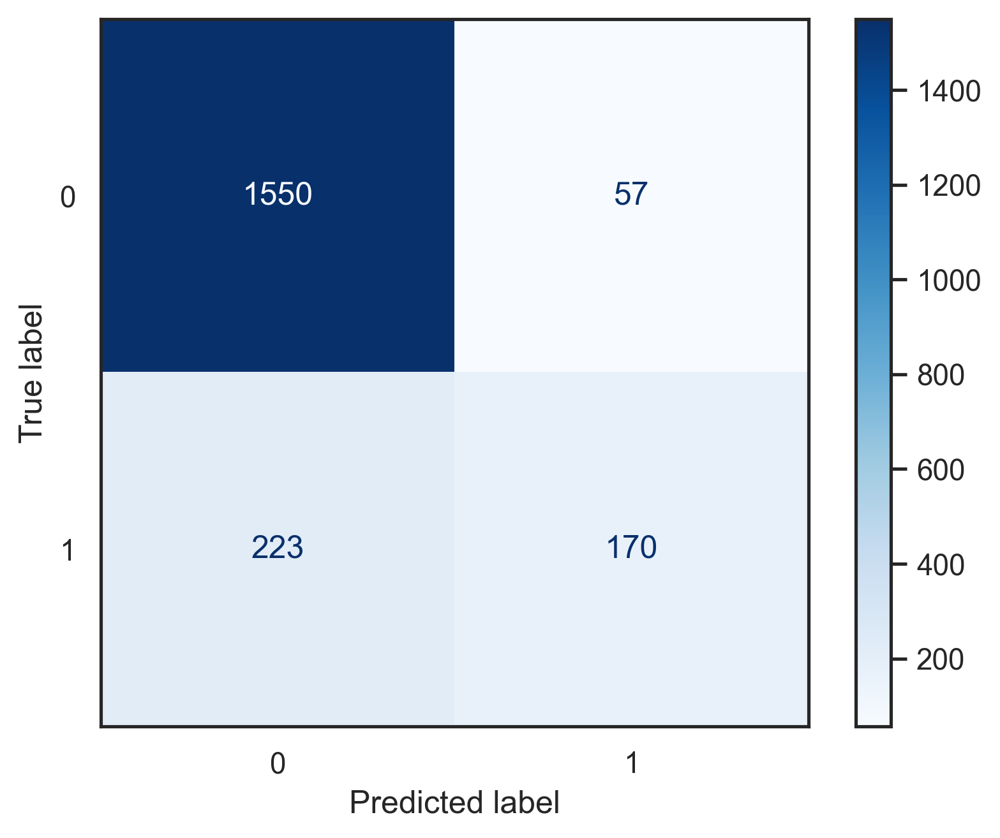

-----------------------------------
Logistic Regression


Classification Report

              precision    recall  f1-score   support

           0       0.92      0.74      0.82      1607
           1       0.41      0.75      0.53       393

    accuracy                           0.74      2000
   macro avg       0.67      0.74      0.68      2000
weighted avg       0.82      0.74      0.77      2000



10-fold Cross Vaildation

accuracy: 73.7%
precision_macro: 66.7%
recall_macro: 73.4%
f1_macro: 67.5%


Logistic Regression Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


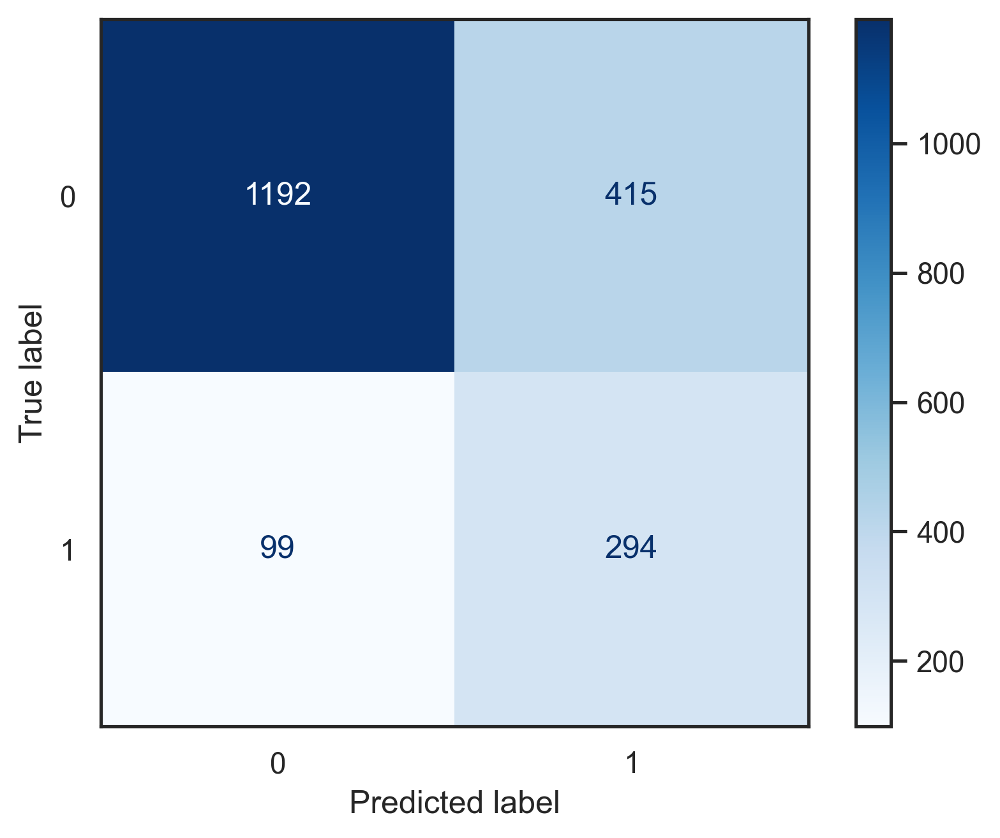

-----------------------------------
SVC


Classification Report

              precision    recall  f1-score   support

           0       0.93      0.78      0.85      1607
           1       0.45      0.74      0.56       393

    accuracy                           0.77      2000
   macro avg       0.69      0.76      0.70      2000
weighted avg       0.83      0.77      0.79      2000



10-fold Cross Vaildation

accuracy: 77.7%
precision_macro: 69.7%
recall_macro: 76.1%
f1_macro: 71.2%


SVC Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


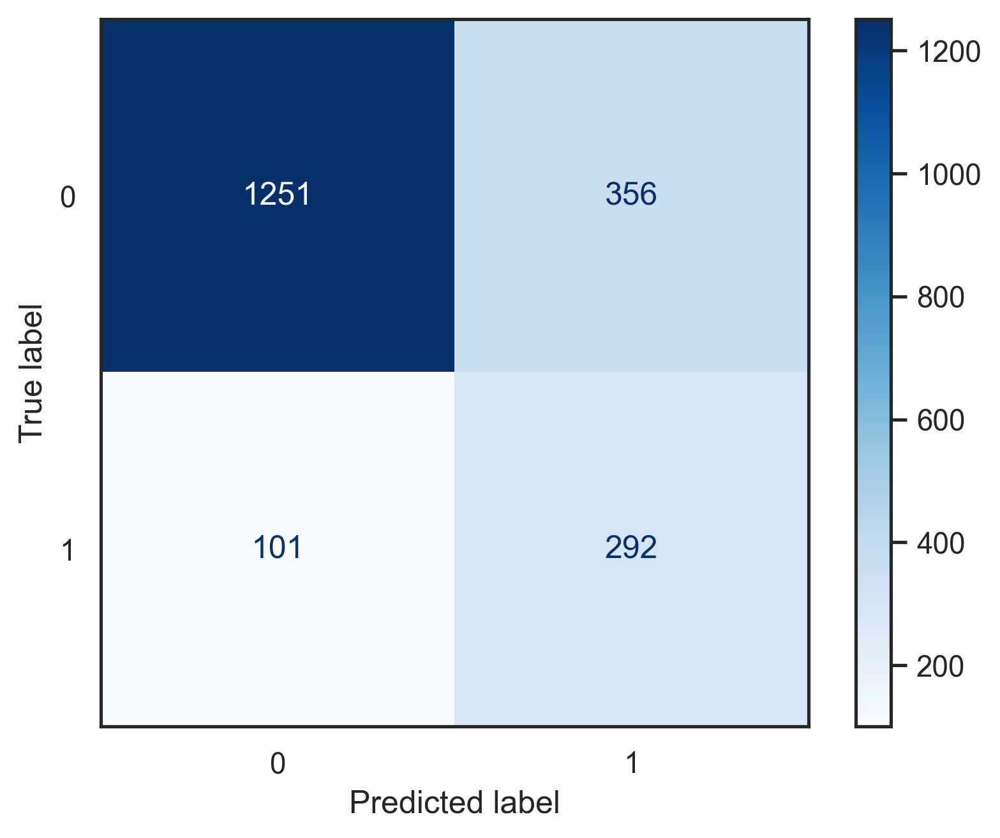

-----------------------------------
Gaussian Naive Bayes


Classification Report

              precision    recall  f1-score   support

           0       0.87      0.86      0.86      1607
           1       0.45      0.48      0.46       393

    accuracy                           0.78      2000
   macro avg       0.66      0.67      0.66      2000
weighted avg       0.79      0.78      0.79      2000



10-fold Cross Vaildation

accuracy: 77.6%
precision_macro: 65.8%
recall_macro: 65.7%
f1_macro: 65.7%


Gaussian Naive Bayes Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


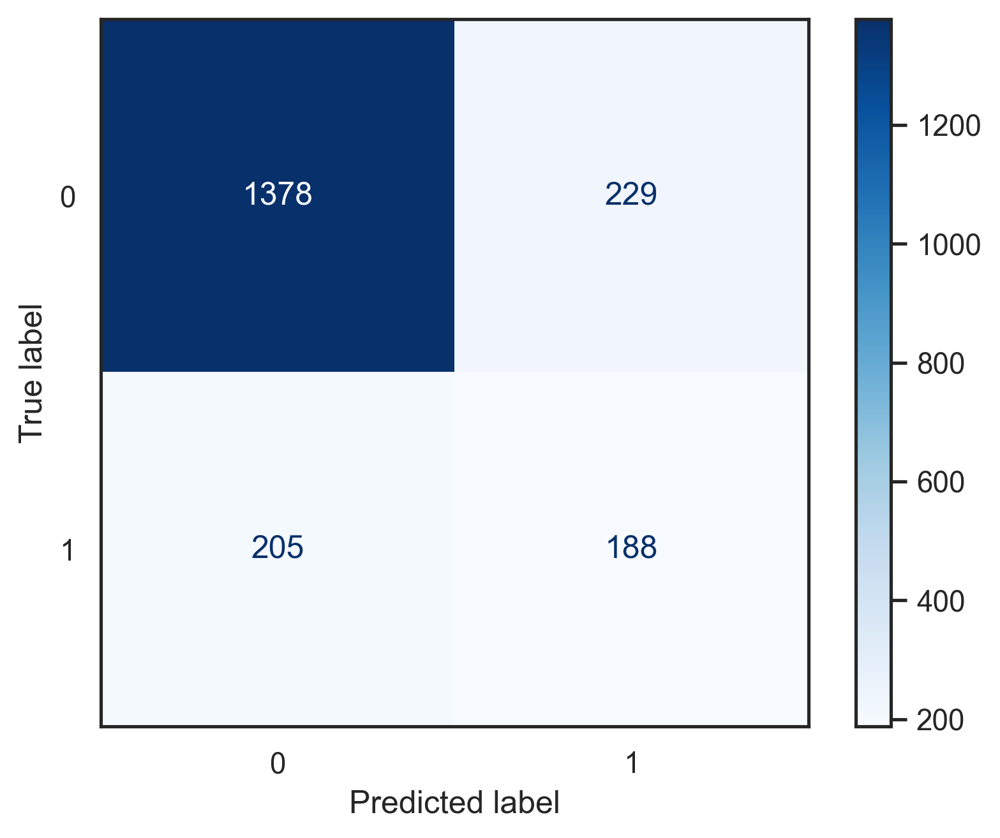

-----------------------------------
KNN


Classification Report

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      1607
           1       0.66      0.46      0.54       393

    accuracy                           0.85      2000
   macro avg       0.77      0.70      0.72      2000
weighted avg       0.83      0.85      0.84      2000



10-fold Cross Vaildation

accuracy: 83.6%
precision_macro: 75.6%
recall_macro: 69.7%
f1_macro: 71.8%


KNN Confusion Matrix



c:\Users\pcdm\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


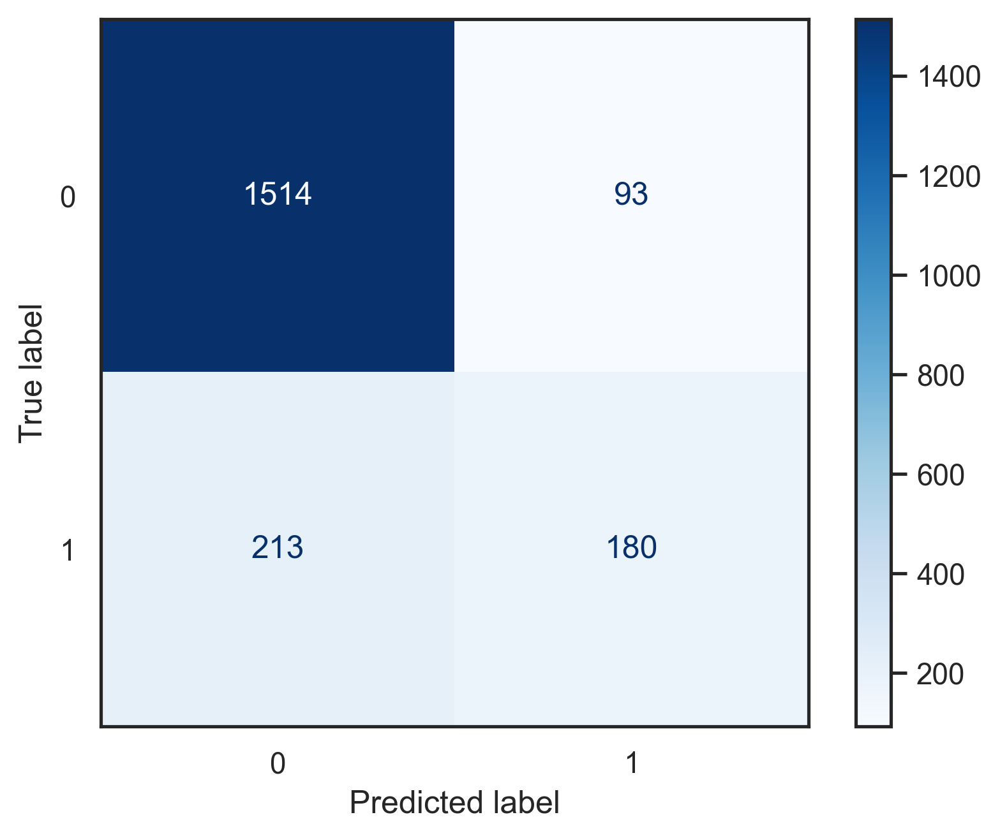

-----------------------------------


In [39]:
from sklearn.metrics import roc_curve, roc_auc_score, classification_report, plot_confusion_matrix
from sklearn.model_selection import cross_val_score

sns.set(style="white")
clf_tpr_fpr = []
val_scorers = ('accuracy', 'precision_macro', 'recall_macro', 'f1_macro')
for clf_name, clf in clfs:
    pipe.set_params(clf=clf)
    pipe.fit(X_train, y_train)
    y_true, y_pred = y_test, pipe.predict(X_test)
    tpr, fpr, _ = roc_curve(y_true, y_pred)
    clf_tpr_fpr.append((clf_name, tpr, fpr, roc_auc_score(y_true, y_pred)))

    print(f'{clf_name}')

    print(f'\n\nClassification Report\n')
    print(classification_report(y_true, y_pred))

    n = 10
    print(f'\n\n{n}-fold Cross Vaildation\n')
    for scoring in val_scorers:
        print(f'{scoring}: {cross_val_score(pipe, X_train, y_train, cv=n, scoring=scoring).mean():.1%}')
    
    print(f'\n\n{clf_name} Confusion Matrix\n')
    plot_confusion_matrix(pipe, X_test, y_test, cmap=plt.cm.Blues)  
    plt.show()
    print('-----------------------------------')

from sklearn.metrics import roc_curve, roc_auc_score, classification_report, plot_confusion_matrix
from sklearn.model_selection import cross_val_score

sns.set(style="white")
clf_tpr_fpr = []
val_scorers = ('accuracy', 'precision_macro', 'recall_macro', 'f1_macro')
for clf_name, clf in clfs:
    pipe.set_params(clf=clf)
    pipe.fit(X_train, y_train)
    y_true, y_pred = y_test, pipe.predict(X_test)
    tpr, fpr, _ = roc_curve(y_true, y_pred)
    clf_tpr_fpr.append((clf_name, tpr, fpr, roc_auc_score(y_true, y_pred)))

    print(f'{clf_name}')

    print(f'\n\nClassification Report\n')
    print(classification_report(y_true, y_pred))

    n = 10
    print(f'\n\n{n}-fold Cross Vaildation\n')
    for scoring in val_scorers:
        print(f'{scoring}: {cross_val_score(pipe, X_train, y_train, cv=n, scoring=scoring).mean():.1%}')
    
    print(f'\n\n{clf_name} Confusion Matrix\n')
    plot_confusion_matrix(pipe, X_test, y_test, cmap=plt.cm.Blues)  
    plt.show()
    print('-----------------------------------')

* ROC Curve

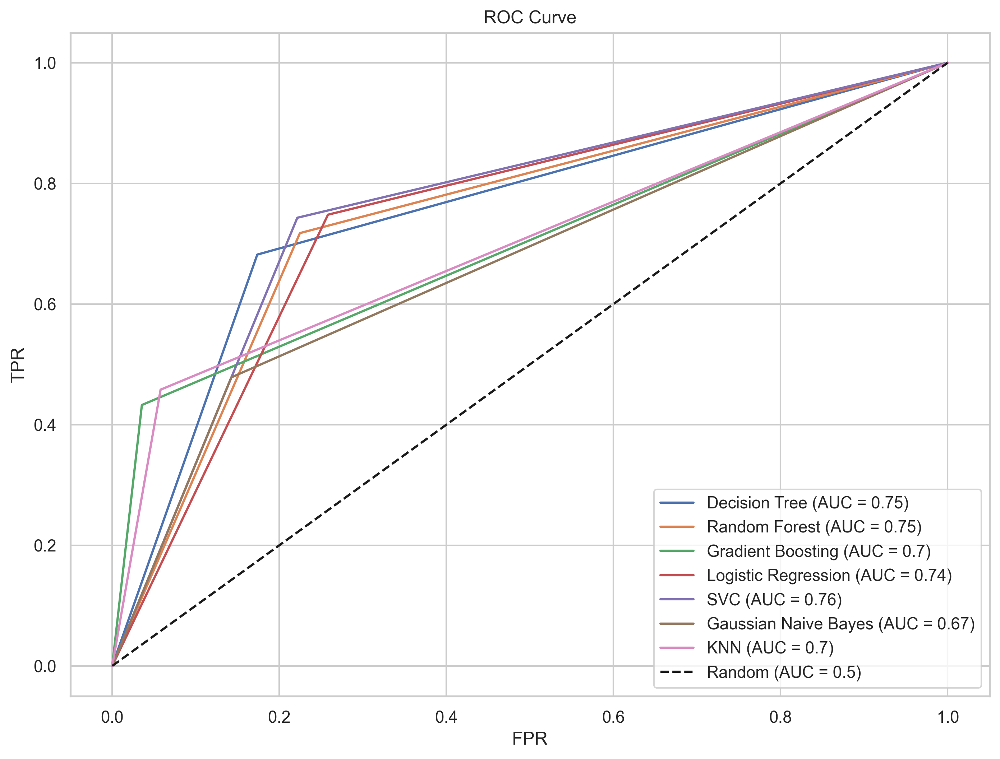

In [40]:
sns.set(style="whitegrid")
plt.figure(figsize = (11,8))
for clf_name, fpr, tpr, score in clf_tpr_fpr:
    plt.plot(fpr, tpr, label = f'{clf_name} (AUC = {score:.2})')
plt.plot([0,1], [0,1], 'k--', label = 'Random (AUC = 0.5)')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.show()